# 3-Stage Shelf Analysis Pipeline
## Stage 1: Dense Product Detection (SKU-110K trained YOLOv8)
## Stage 2: Empty Space Detection (your best.pt)
## Stage 3: Product Identification (CLIP → RP2K reference images)

**The problem with the old pipeline:** YOLOv8n pretrained on COCO can't find products on shelves — it was trained on dogs, cars, and people, not densely packed grocery items.

**The fix:** Train a YOLOv8 model on the SKU-110K dataset, which has 11,762 shelf images with 1.7 million product bounding boxes. This model draws a box around EVERY product on a shelf, just like the [SKU-110K examples](https://docs.ultralytics.com/datasets/detect/sku-110k/).

**Complete pipeline:**
```
Shelf Image
    │
    ├──→ [Stage 1] SKU-110K YOLOv8  →  Detect ALL products (dense bboxes)
    │
    ├──→ [Stage 2] Your best.pt     →  Detect ALL empty spaces
    │
    └──→ [Stage 3] CLIP + RP2K      →  Identify each product by name
                                         (match crop against reference photos)
```

**Kaggle Setup:**
- **GPU:** T4 (required for training) — Settings > Accelerator > GPU T4 x2
- **Internet:** ON (needed to download SKU-110K and models)
- **Add Data:** 
  - Your `best.pt` model (already uploaded as `kushalchhetri07/emptyspace`)
  - RP2K dataset: search `khyeh0719/rp2k-dataset`


In [7]:
# ============================================================
# Cell 1: Install & verify GPU
# ============================================================
!pip install -q ultralytics roboflow transformers easyocr

import torch

print(f"PyTorch: {torch.__version__}")
print(f"CUDA: {torch.cuda.is_available()}")

if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"VRAM: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")

PyTorch: 2.10.0+cu128
CUDA: True
GPU: Tesla T4
VRAM: 15.6 GB


In [8]:
# ============================================================
# Cell 2: Imports
# ============================================================
import os, json, csv, glob, hashlib, shutil
import numpy as np
import cv2
from pathlib import Path
from datetime import datetime
from dataclasses import dataclass, field, asdict
from typing import List, Dict, Optional
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
OUTPUT_DIR = "/kaggle/working/planogram_output"
os.makedirs(OUTPUT_DIR, exist_ok=True)
print(f"Device: {DEVICE}")

Device: cuda


---
# STAGE 1: Train Dense Product Detector on SKU-110K

This trains a YOLOv8 model to find **every product** on a shelf.
SKU-110K has 8,219 training images with ~1.7M product annotations.

Training takes ~4 hours on T4 for 25 epochs. You only need to do this ONCE —
after training, save the weights and skip this cell next time.


In [9]:
# ============================================================
# Cell 3 (FIXED): Train dense product detector
# ============================================================
# The auto-download via SKU-110K.yaml corrupts the 13.6GB tar.gz.
# Fix: Download from Roboflow instead (pre-formatted, no tar issues)

from ultralytics import YOLO
from roboflow import Roboflow
import os

TRAIN_SKU110K = True  # Set False after first run

if TRAIN_SKU110K:
    # Download SKU-110K from Roboflow (already in YOLOv8 format)
    rf = Roboflow(api_key="qD3iNzdjJ3CCYP797XJ9")
    project = rf.workspace("jacobs-workspace").project("sku-110k")
    dataset = project.version(6).download("yolov8", location="/kaggle/working/sku110k")
    
    SKU110K_YAML = "/kaggle/working/sku110k/data.yaml"
    print(f"Dataset: {SKU110K_YAML}")
    
    # Verify download
    for split in ['train', 'valid', 'test']:
        d = f"/kaggle/working/sku110k/{split}/images"
        if os.path.isdir(d):
            print(f"  {split}: {len(os.listdir(d))} images")
    
    # Train
    model = YOLO("yolov8s.pt")
    results = model.train(
        data=SKU110K_YAML,
        epochs=25,
        imgsz=640,
        batch=16,
        device=DEVICE,
        project="/kaggle/working",
        name="sku110k_detector",
        patience=5,
        save=True,
        workers=2,
    )
    
    PRODUCT_MODEL_PATH = "/kaggle/working/sku110k_detector/weights/best.pt"
    print(f"\nDone! Weights: {PRODUCT_MODEL_PATH}")
    print("Save this as a Kaggle dataset so you skip training next time!")

else:
    # After first run, upload best.pt as dataset, then:
    PRODUCT_MODEL_PATH = "/kaggle/input/your-sku110k-weights/best.pt"
    print(f"Loading: {PRODUCT_MODEL_PATH}")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /kaggle/working/sku110k in yolov8:: 100%|██████████| 20008/20008 [00:22<00:00, 901.67it/s] 


Dataset: /kaggle/working/sku110k/data.yaml
  train: 6998 images
  valid: 2000 images
  test: 1000 images
Ultralytics 8.4.26 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/sku110k/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=25, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=sku110k_

In [11]:
# Fix: find the actual weights path (might be sku110k_detector, sku110k_detector2, etc.)
import glob
weight_files = sorted(glob.glob("/kaggle/working/sku110k_detector*/weights/best.pt"))
if weight_files:
    PRODUCT_MODEL_PATH = weight_files[-1]  # use the latest one
    print(f"Found weights: {PRODUCT_MODEL_PATH}")
else:
    print("ERROR: No trained weights found!")

Found weights: /kaggle/working/sku110k_detector2/weights/best.pt


Product detector loaded: /kaggle/working/sku110k_detector2/weights/best.pt
Classes: {0: 'object'}
loading Roboflow workspace...
loading Roboflow project...

Found 5 test images

Test image: train_0_jpg.rf.0868a8cc4b8a9b04e348d163a162b509.jpg
Products detected: 139


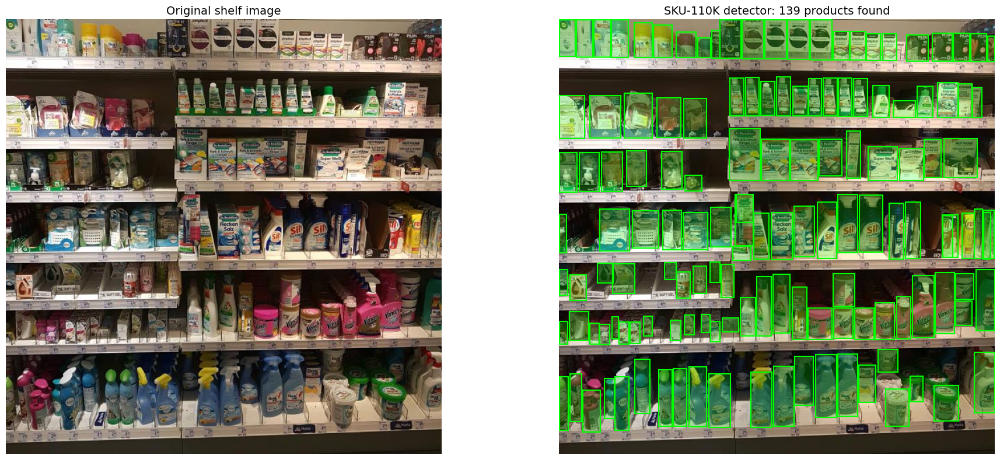

In [18]:
# ============================================================
# Cell 4: Quick test — does the SKU-110K model find all products?
# ============================================================

# Load the trained dense detector
product_detector = YOLO(PRODUCT_MODEL_PATH)
print(f"Product detector loaded: {product_detector.model_name if hasattr(product_detector, 'model_name') else PRODUCT_MODEL_PATH}")
print(f"Classes: {product_detector.names}")

# Download a test shelf image from the Roboflow dataset
from roboflow import Roboflow
rf = Roboflow(api_key="qD3iNzdjJ3CCYP797XJ9")
project5 = rf.workspace("final-project-object-detection-for-instore-inventory-management") \
             .project("empty-spaces-in-a-supermarket-hanger-1upsp")
dataset5 = project5.version(1).download("yolov8", location="/kaggle/working/shelf_dataset")

# Find test images
shelf_image_dirs = []
for split in ["test/images", "valid/images", "train/images"]:
    d = f"/kaggle/working/shelf_dataset/{split}"
    if os.path.isdir(d):
        shelf_image_dirs.append(d)
        
test_images = []
for d in shelf_image_dirs:
    test_images += sorted(glob.glob(os.path.join(d, "*.jpg")))[:5]

print(f"\nFound {len(test_images)} test images")

# Run dense detection on first image
if test_images:
    test_img = test_images[0]
    results = product_detector.predict(test_img, conf=0.25, device=DEVICE, verbose=False)
    
    n_products = len(results[0].boxes) if results[0].boxes is not None else 0
    print(f"\nTest image: {os.path.basename(test_img)}")
    print(f"Products detected: {n_products}")
    
    # Visualize
    img = cv2.imread(test_img)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
    
    ax1.imshow(img_rgb)
    ax1.set_title("Original shelf image", fontsize=14)
    ax1.axis("off")
    
    ax2.imshow(img_rgb)
    if results[0].boxes is not None:
        for box in results[0].boxes:
            x1, y1, x2, y2 = box.xyxy[0].tolist()
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1,
                                     linewidth=1.5, edgecolor="lime", facecolor="lime", alpha=0.2)
            ax2.add_patch(rect)
            rect2 = patches.Rectangle((x1, y1), x2-x1, y2-y1,
                                      linewidth=1.5, edgecolor="lime", facecolor="none")
            ax2.add_patch(rect2)
    ax2.set_title(f"SKU-110K detector: {n_products} products found", fontsize=14)
    ax2.axis("off")
    
    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, "sku110k_test.png"), dpi=150)
    plt.show()

---
# STAGE 2: Empty Space Detection (your best.pt)

Your trained model handles this. Let's verify it works on the same test image.


Empty-space model loaded
Classes: {0: 'empty_space'}
Empty spaces detected: 4


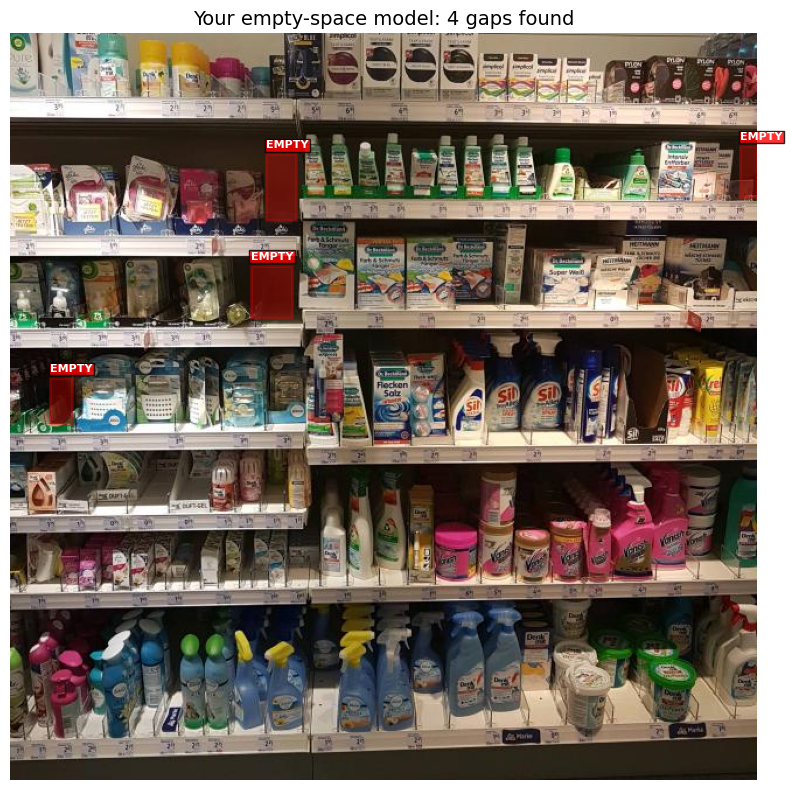

In [23]:
# ============================================================
# Cell 5: Load your empty-space model
# ============================================================
EMPTY_MODEL_PATH = "/kaggle/input/models/kushalchhetri07/emptyspace/other/default/1/best.pt"
#EMPTY_MODEL_PATH = "/kaggle/input/models/kushalchhetri07/shruti-model/other/default/1/best (1).pt"

empty_detector = YOLO(EMPTY_MODEL_PATH)
print(f"Empty-space model loaded")
print(f"Classes: {empty_detector.names}")

# Test on same image
if test_images:
    results = empty_detector.predict(test_images[0], conf=0.1, device=DEVICE, verbose=False)
    n_empty = len(results[0].boxes) if results[0].boxes is not None else 0
    print(f"Empty spaces detected: {n_empty}")
    
    # Visualize
    img_rgb = cv2.cvtColor(cv2.imread(test_images[0]), cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(figsize=(14, 8))
    ax.imshow(img_rgb)
    if results[0].boxes is not None:
        for box in results[0].boxes:
            x1, y1, x2, y2 = box.xyxy[0].tolist()
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1,
                                     linewidth=2, edgecolor="red", facecolor="red", alpha=0.3)
            ax.add_patch(rect)
            ax.text(x1, y1-5, "EMPTY", color="white", fontsize=8, fontweight="bold",
                    bbox=dict(facecolor="red", alpha=0.8, pad=1))
    ax.set_title(f"Your empty-space model: {n_empty} gaps found", fontsize=14)
    ax.axis("off")
    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, "empty_space_test.png"), dpi=150)
    plt.show()

---
# STAGE 3: Product Identification (CLIP + RP2K)

For each product box detected in Stage 1, we:
1. Crop the product from the shelf image
2. Compute its CLIP image embedding
3. Find the most similar product in the RP2K reference database

This gives us actual product names instead of just "product."


In [36]:
# ============================================================
# Cell 6: Build CLIP reference database from RP2K
# ============================================================
from transformers import CLIPProcessor, CLIPModel
import torch

CLIP_MODEL_NAME = "openai/clip-vit-base-patch32"
RP2K_PATH = "/kaggle/input/datasets/khyeh0719/rp2k-dataset/rp2k_dataset"
MAX_REF_PER_CLASS = 5
REF_DB_PATH = os.path.join(OUTPUT_DIR, "clip_ref_db.pt")


def extract_tensor(output):
    """Extract a plain tensor from whatever CLIP returns."""
    if isinstance(output, torch.Tensor):
        return output
    if isinstance(output, tuple):
        return output[0] if isinstance(output[0], torch.Tensor) else output[1]
    if hasattr(output, 'pooler_output') and output.pooler_output is not None:
        return output.pooler_output
    if hasattr(output, 'last_hidden_state'):
        return output.last_hidden_state[:, 0, :]
    # Last resort
    for attr in ['image_embeds', 'text_embeds']:
        if hasattr(output, attr) and getattr(output, attr) is not None:
            return getattr(output, attr)
    raise ValueError(f"Cannot extract tensor from {type(output)}")


class CLIPReferenceDB:
    def __init__(self, model_name=CLIP_MODEL_NAME, device=DEVICE):
        print(f"Loading CLIP: {model_name}...")
        self.model = CLIPModel.from_pretrained(model_name).to(device).eval()
        self.processor = CLIPProcessor.from_pretrained(model_name)
        self.device = device
        self.embeddings = None
        self.labels = []
        self.paths = []
        print("CLIP ready.")

    def build(self, root_dir, max_per_class=5):
        """Build reference DB from folder structure: root/class_name/images."""
        class_dirs = sorted([d for d in os.listdir(root_dir)
                            if os.path.isdir(os.path.join(root_dir, d))])
        print(f"Building reference DB from {len(class_dirs)} product classes...")
        
        all_embeds = []
        for i, cls in enumerate(class_dirs):
            imgs = sorted(glob.glob(os.path.join(root_dir, cls, "*.jpg")) +
                         glob.glob(os.path.join(root_dir, cls, "*.png")))[:max_per_class]
            if not imgs:
                continue
            
            pil_imgs = []
            for p in imgs:
                try:
                    pil_imgs.append(Image.open(p).convert("RGB"))
                    self.labels.append(cls)
                    self.paths.append(p)
                except:
                    continue
            
            if pil_imgs:
                inputs = self.processor(images=pil_imgs, return_tensors="pt", padding=True).to(self.device)
                with torch.no_grad():
                    raw = self.model.get_image_features(**inputs)
                    feats = extract_tensor(raw)
                    feats = feats / feats.norm(dim=-1, keepdim=True)
                all_embeds.append(feats.cpu())
            
            if (i+1) % 200 == 0:
                print(f"  {i+1}/{len(class_dirs)} classes embedded...")
        
        self.embeddings = torch.cat(all_embeds, dim=0)
        print(f"Done: {self.embeddings.shape[0]} images, {len(set(self.labels))} classes")

    def identify(self, crop_bgr, top_k=3):
        """Match a cropped product image against reference DB."""
        rgb = cv2.cvtColor(crop_bgr, cv2.COLOR_BGR2RGB)
        pil = Image.fromarray(rgb)
        inputs = self.processor(images=pil, return_tensors="pt").to(self.device)
        with torch.no_grad():
            raw = self.model.get_image_features(**inputs)
            feat = extract_tensor(raw)
            feat = feat / feat.norm(dim=-1, keepdim=True)
        
        sims = (feat.cpu() @ self.embeddings.T).squeeze(0).numpy()
        top_idx = np.argsort(sims)[::-1][:top_k]
        
        matches = [{"label": self.labels[i].replace("_"," ").title(),
                    "score": round(float(sims[i]), 4)} for i in top_idx]
        return matches[0]["label"], matches[0]["score"], matches

    def save(self, path):
        torch.save({"embeddings": self.embeddings, "labels": self.labels, "paths": self.paths}, path)
        print(f"Saved to {path}")

    def load(self, path):
        data = torch.load(path, map_location="cpu")
        self.embeddings, self.labels, self.paths = data["embeddings"], data["labels"], data["paths"]
        print(f"Loaded: {self.embeddings.shape[0]} refs, {len(set(self.labels))} classes")


# Build or load
if os.path.exists(REF_DB_PATH):
    ref_db = CLIPReferenceDB()
    ref_db.load(REF_DB_PATH)
else:
    rp2k_root = None
    for candidate in [os.path.join(RP2K_PATH, "all", "train"),
                      os.path.join(RP2K_PATH, "train"),
                      os.path.join(RP2K_PATH, "all"), RP2K_PATH]:
        if os.path.isdir(candidate):
            subs = [d for d in os.listdir(candidate) if os.path.isdir(os.path.join(candidate, d))]
            if len(subs) > 10:
                rp2k_root = candidate
                break
    
    if rp2k_root:
        print(f"RP2K root: {rp2k_root}")
        ref_db = CLIPReferenceDB()
        ref_db.build(rp2k_root, max_per_class=MAX_REF_PER_CLASS)
        ref_db.save(REF_DB_PATH)
    else:
        print(f"ERROR: Cannot find RP2K classes in {RP2K_PATH}")
        print("Contents:", os.listdir(RP2K_PATH)[:15])
        ref_db = None

RP2K root: /kaggle/input/datasets/khyeh0719/rp2k-dataset/rp2k_dataset/all/train
Loading CLIP: openai/clip-vit-base-patch32...


Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch32
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
text_model.embeddings.position_ids   | UNEXPECTED |  | 
vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


CLIP ready.
Building reference DB from 2384 product classes...
  200/2384 classes embedded...
  400/2384 classes embedded...
  600/2384 classes embedded...
  800/2384 classes embedded...
  1000/2384 classes embedded...
  1200/2384 classes embedded...
  1400/2384 classes embedded...
  1600/2384 classes embedded...
  1800/2384 classes embedded...
  2000/2384 classes embedded...
  2200/2384 classes embedded...
Done: 11763 images, 2384 classes
Saved to /kaggle/working/planogram_output/clip_ref_db.pt


---
# Full Pipeline: Combine All 3 Stages
Run the dense product detector + empty-space detector on shelf images,
then identify each product via CLIP.


In [40]:
# ============================================================
# Cell 7: Combined 3-stage pipeline
# ============================================================

def analyze_shelf(image_path, product_detector, empty_detector, ref_db,
                  product_conf=0.25, empty_conf=0.1, iou_thresh=0.4):
    """
    3-stage shelf analysis:
    1. SKU-110K model → find ALL products
    2. Your best.pt → find ALL empty spaces  
    3. CLIP + RP2K → identify each product
    """
    img = cv2.imread(image_path)
    h, w = img.shape[:2]
    
    # ── Stage 1: Dense product detection ──
    prod_results = product_detector.predict(image_path, conf=product_conf,
                                             device=DEVICE, verbose=False)
    products = []
    if prod_results[0].boxes is not None:
        for box in prod_results[0].boxes:
            x1, y1, x2, y2 = [int(v) for v in box.xyxy[0].tolist()]
            conf = float(box.conf[0])
            products.append({
                "x1": max(0,x1), "y1": max(0,y1), "x2": min(w,x2), "y2": min(h,y2),
                "cx": ((x1+x2)/2)/w, "cy": ((y1+y2)/2)/h,
                "w": (x2-x1)/w, "h": (y2-y1)/h,
                "confidence": conf, "source": "sku110k",
            })
    
    # ── Stage 2: Empty space detection ──
    empty_results = empty_detector.predict(image_path, conf=empty_conf,
                                            device=DEVICE, verbose=False)
    empties = []
    if empty_results[0].boxes is not None:
        for box in empty_results[0].boxes:
            x1, y1, x2, y2 = [int(v) for v in box.xyxy[0].tolist()]
            conf = float(box.conf[0])
            cls_id = int(box.cls[0])
            cls_name = empty_detector.names.get(cls_id, "empty_space")
            empties.append({
                "x1": max(0,x1), "y1": max(0,y1), "x2": min(w,x2), "y2": min(h,y2),
                "cx": ((x1+x2)/2)/w, "cy": ((y1+y2)/2)/h,
                "w": (x2-x1)/w, "h": (y2-y1)/h,
                "confidence": conf, "source": "empty", "class_name": cls_name,
            })
    
    # ── Resolve overlaps ──
    # If a product and empty box overlap heavily, keep higher confidence
    kept_products = []
    kept_empties = list(empties)
    for p in products:
        overlaps = False
        for i, e in enumerate(kept_empties):
            iou = compute_iou(p, e)
            if iou > iou_thresh:
                overlaps = True
                if p["confidence"] > e["confidence"]:
                    kept_empties.pop(i)
                    kept_products.append(p)
                break
        if not overlaps:
            kept_products.append(p)
    
    products = kept_products
    empties = kept_empties
    
    print(f"  Stage 1: {len(products)} products | Stage 2: {len(empties)} empty spaces")
    
    # ── Stage 3: Identify each product via CLIP ──
    if ref_db is not None and products:
        print(f"  Stage 3: Identifying {len(products)} products via CLIP...")
        for p in products:
            # Crop with 5% padding
            pad_x = int((p["x2"]-p["x1"]) * 0.05)
            pad_y = int((p["y2"]-p["y1"]) * 0.05)
            cx1 = max(0, p["x1"]-pad_x)
            cy1 = max(0, p["y1"]-pad_y)
            cx2 = min(w, p["x2"]+pad_x)
            cy2 = min(h, p["y2"]+pad_y)
            crop = img[cy1:cy2, cx1:cx2]
            
            if crop.size > 0:
                name, score, matches = ref_db.identify(crop)
                p["product_name"] = name
                p["clip_score"] = score
                p["clip_top3"] = matches
            else:
                p["product_name"] = "Unknown"
                p["clip_score"] = 0
                p["clip_top3"] = []
    else:
        for p in products:
            p["product_name"] = "Product"
            p["clip_score"] = 0
            p["clip_top3"] = []
    
    # ── Cluster into shelves ──
    all_dets = products + empties
    shelves = cluster_to_shelves(all_dets, products, empties, w, h)
    
    total_p = sum(len(s["products"]) for s in shelves)
    total_e = sum(len(s["empties"]) for s in shelves)
    
    return {
        "image": os.path.basename(image_path),
        "width": w, "height": h,
        "total_shelves": len(shelves),
        "total_products": total_p,
        "total_empty": total_e,
        "fill_rate": round(total_p / max(1, total_p + total_e), 3),
        "shelves": shelves,
    }


def compute_iou(a, b):
    xa, ya = max(a["x1"],b["x1"]), max(a["y1"],b["y1"])
    xb, yb = min(a["x2"],b["x2"]), min(a["y2"],b["y2"])
    inter = max(0,xb-xa) * max(0,yb-ya)
    if inter == 0: return 0
    return inter / ((a["x2"]-a["x1"])*(a["y2"]-a["y1"]) + (b["x2"]-b["x1"])*(b["y2"]-b["y1"]) - inter)


def cluster_to_shelves(all_dets, products, empties, img_w, img_h):
    if not all_dets:
        return []
    
    cy_vals = sorted(d["cy"] for d in all_dets)
    bands, cur = [], [cy_vals[0]]
    for cy in cy_vals[1:]:
        if cy - cur[-1] < 0.06:
            cur.append(cy)
        else:
            bands.append(cur)
            cur = [cy]
    bands.append(cur)
    
    shelf_ranges = []
    for band in bands:
        cy_m = float(np.mean(band))
        band_d = [d for d in all_dets if abs(d["cy"]-cy_m) < 0.08]
        yt = min(d["cy"]-d["h"]/2 for d in band_d) if band_d else cy_m-0.05
        yb = max(d["cy"]+d["h"]/2 for d in band_d) if band_d else cy_m+0.05
        shelf_ranges.append((max(0,yt), min(1,yb), cy_m))
    
    # Merge close
    merged = [shelf_ranges[0]]
    for yt, yb, cy in shelf_ranges[1:]:
        if abs(cy - merged[-1][2]) < 0.06:
            merged[-1] = (min(merged[-1][0],yt), max(merged[-1][1],yb),
                          (min(merged[-1][0],yt)+max(merged[-1][1],yb))/2)
        else:
            merged.append((yt, yb, cy))
    
    shelves = []
    loc_id = 1
    for si, (yt, yb, cy) in enumerate(merged):
        m = 0.03
        s_prods = sorted([p for p in products if yt-m<=p["cy"]<=yb+m], key=lambda d:d["cx"])
        s_emps = sorted([e for e in empties if yt-m<=e["cy"]<=yb+m], key=lambda d:d["cx"])
        
        shelf_products = []
        for p in s_prods:
            shelf_products.append({
                "loc_id": loc_id,
                "name": p.get("product_name", "Product"),
                "clip_score": p.get("clip_score", 0),
                "clip_top3": p.get("clip_top3", []),
                "confidence": round(p["confidence"], 3),
                "facings": max(1, round(p["w"] / 0.04)),
                "bbox": {"cx":round(p["cx"],4),"cy":round(p["cy"],4),"w":round(p["w"],4),"h":round(p["h"],4)},
                "bbox_px": {"x1":p["x1"],"y1":p["y1"],"x2":p["x2"],"y2":p["y2"]},
                "status": "stocked",
            })
            loc_id += 1
        
        shelf_empties = []
        for e in s_emps:
            shelf_empties.append({
                "loc_id": loc_id,
                "name": e.get("class_name", "empty_space"),
                "confidence": round(e["confidence"], 3),
                "bbox": {"cx":round(e["cx"],4),"cy":round(e["cy"],4),"w":round(e["w"],4),"h":round(e["h"],4)},
                "bbox_px": {"x1":e["x1"],"y1":e["y1"],"x2":e["x2"],"y2":e["y2"]},
                "status": "empty",
            })
            loc_id += 1
        
        n = len(shelf_products) + len(shelf_empties)
        shelves.append({
            "shelf_number": si + 1,
            "y_top": round(yt, 4), "y_bottom": round(yb, 4),
            "products": shelf_products,
            "empties": shelf_empties,
            "fill_rate": round(len(shelf_products) / max(1, n), 3),
        })
    
    return shelves

print("Pipeline functions defined.")

Pipeline functions defined.


In [48]:
# ============================================================
# Cell 8: Run on Roboflow shelf images
# ============================================================

# Collect all shelf images from the downloaded dataset
all_shelf_images = []
for split in ["test/images", "valid/images", "train/images"]:
    d = f"/kaggle/working/shelf_dataset/{split}"
    if os.path.isdir(d):
        all_shelf_images += sorted(glob.glob(os.path.join(d, "*.jpg")) +
                                   glob.glob(os.path.join(d, "*.png")))

print(f"Total shelf images available: {len(all_shelf_images)}")

# Process (limit to first N for quick testing, then increase)
MAX_IMAGES = 20  # Set higher for full run
images_to_process = all_shelf_images[:MAX_IMAGES]
print(f"Processing {len(images_to_process)} images...")

all_results = []
for idx, img_path in enumerate(images_to_process):
    print(f"\n{'='*60}")
    print(f"[{idx+1}/{len(images_to_process)}] {os.path.basename(img_path)}")
    
    try:
        result = analyze_shelf(img_path, product_detector, empty_detector, ref_db)
        all_results.append(result)
        
        print(f"  Result: {result['total_products']} products, "
              f"{result['total_empty']} empty, "
              f"fill={result['fill_rate']:.0%}")
        
        # Print product names for each shelf
        for shelf in result["shelves"]:
            print(f"  --- Shelf {shelf['shelf_number']} (fill: {shelf['fill_rate']:.0%}) ---")
            for p in shelf["products"][:5]:
                score_str = f" (CLIP: {p['clip_score']:.2f})" if p.get('clip_score') else ""
                print(f"    #{p['loc_id']:3d}: {p['name']:30s}{score_str}")
            if len(shelf["products"]) > 5:
                print(f"    ... +{len(shelf['products'])-5} more products")
            for e in shelf["empties"]:
                print(f"    #{e['loc_id']:3d}: ** EMPTY ** (conf={e['confidence']:.2f})")
        
        # Save individual JSON
        stem = Path(img_path).stem
        with open(os.path.join(OUTPUT_DIR, f"{stem}_planogram.json"), "w") as f:
            json.dump(result, f, indent=2, default=str)
    
    except Exception as ex:
        print(f"  ERROR: {ex}")
        import traceback; traceback.print_exc()

Total shelf images available: 191
Processing 20 images...

[1/20] train_0_jpg.rf.0868a8cc4b8a9b04e348d163a162b509.jpg
  Stage 1: 139 products | Stage 2: 4 empty spaces
  Stage 3: Identifying 139 products via CLIP...
  Result: 104 products, 3 empty, fill=97%
  --- Shelf 1 (fill: 100%) ---
    #  1: 牡丹（金细支）                        (CLIP: 0.88)
    #  2: 红旗渠（薄荷）                        (CLIP: 0.94)
    #  3: 好猫（金丝猴）                        (CLIP: 0.92)
    #  4: 燕京鲜啤                           (CLIP: 0.93)
    #  5: 海天珍酿生抽                         (CLIP: 0.92)
    ... +18 more products
  --- Shelf 2 (fill: 91%) ---
    # 24: 嘉士伯醇滑罐啤                        (CLIP: 0.90)
    # 25: 三得利啤酒9度纯生500 6牛卡纸组合装           (CLIP: 0.89)
    # 26: 三得利啤酒9度纯生500 6牛卡纸组合装           (CLIP: 0.92)
    # 27: 大华（大时代硬包烟）                     (CLIP: 0.92)
    # 28: 八公山香辣腐乳                        (CLIP: 0.93)
    ... +15 more products
    # 44: ** EMPTY ** (conf=0.14)
    # 45: ** EMPTY ** (conf=0.23)
  --- Shelf 3 (fill: 

In [47]:
# Install Chinese font for matplotlib
!apt-get install -y fonts-noto-cjk > /dev/null 2>&1

import matplotlib
import matplotlib.font_manager as fm

# Register the font
font_path = "/usr/share/fonts/opentype/noto/NotoSansCJK-Regular.ttc"
if os.path.exists(font_path):
    fm.fontManager.addfont(font_path)
    matplotlib.rcParams['font.family'] = ['Noto Sans CJK JP', 'DejaVu Sans']
    print("Chinese font loaded!")
else:
    # Try alternative path
    for f in glob.glob("/usr/share/fonts/**/Noto*CJK*", recursive=True):
        fm.fontManager.addfont(f)
        print(f"Added font: {f}")
    matplotlib.rcParams['font.family'] = ['Noto Sans CJK JP', 'DejaVu Sans']

# Clear matplotlib font cache
matplotlib.font_manager._load_fontmanager(try_read_cache=False)
print("Font cache refreshed")

Chinese font loaded!
Font cache refreshed


In [53]:
# Add at the top of the notebook (Cell 2 or beginning of Cell 7)
!pip install -q deep-translator

from deep_translator import GoogleTranslator
translator = GoogleTranslator(source='zh-CN', target='en')

# Cache translations to avoid re-translating the same names
translation_cache = {}

def translate_name(name):
    """Translate Chinese product name to English."""
    if name in translation_cache:
        return translation_cache[name]
    try:
        # Skip if already English
        if all(ord(c) < 128 for c in name.replace(" ", "")):
            return name
        translated = translator.translate(name)
        translation_cache[name] = translated
        return translated
    except:
        return name

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.3/42.3 kB 2.1 MB/s eta 0:00:00


In [54]:
from deep_translator import GoogleTranslator
translator = GoogleTranslator(source='zh-CN', target='en')
cache = {}

def translate(name):
    if name in cache:
        return cache[name]
    if all(ord(c) < 128 for c in name.replace(" ", "")):
        return name
    try:
        t = translator.translate(name)
        cache[name] = t
        return t
    except:
        return name

for result in all_results:
    for shelf in result["shelves"]:
        for p in shelf["products"]:
            original = p["name"]
            p["name_zh"] = original
            p["name"] = translate(original)
            
print(f"Translated {len(cache)} unique product names")
print("\nSample translations:")
for zh, en in list(cache.items())[:10]:
    print(f"  {zh}  →  {en}")

Translated 178 unique product names

Sample translations:
  牡丹（金细支）  →  Peony (golden branches)
  红旗渠（薄荷）  →  Hongqi Canal (Mint)
  好猫（金丝猴）  →  Good cat (golden monkey)
  燕京鲜啤  →  Yanjing fresh beer
  海天珍酿生抽  →  Haitian Zhenjing Light Soy Sauce
  恒顺老酒  →  Hengshun old wine
  三得利啤酒清爽10度330罐啤组合装  →  Suntory Beer Refreshing 10% 330 Can Beer Combination Pack
  阿萨姆奶茶  →  Assam milk tea
  金圣（滕王阁·紫光）  →  Golden Saint (Tengwang Pavilion·Purple Light)
  长城（醇雅 Coco）  →  Great Wall (Elegant Coco)


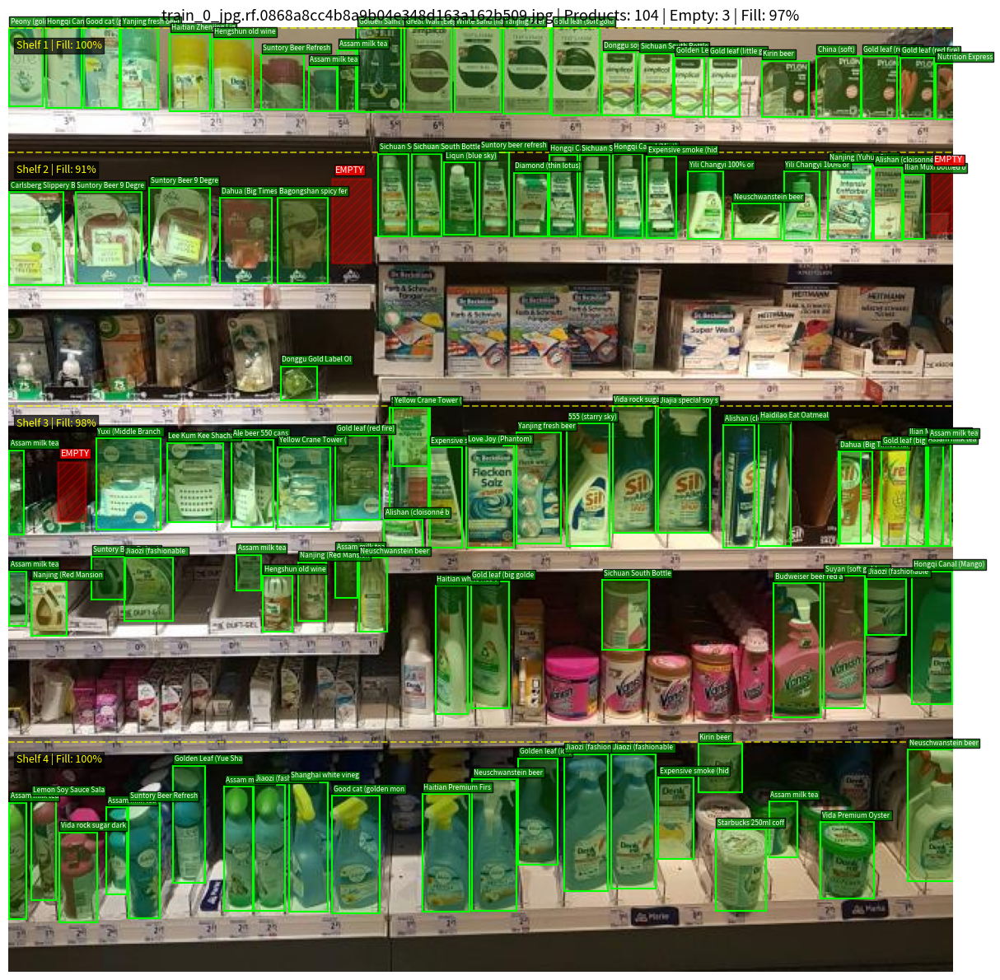

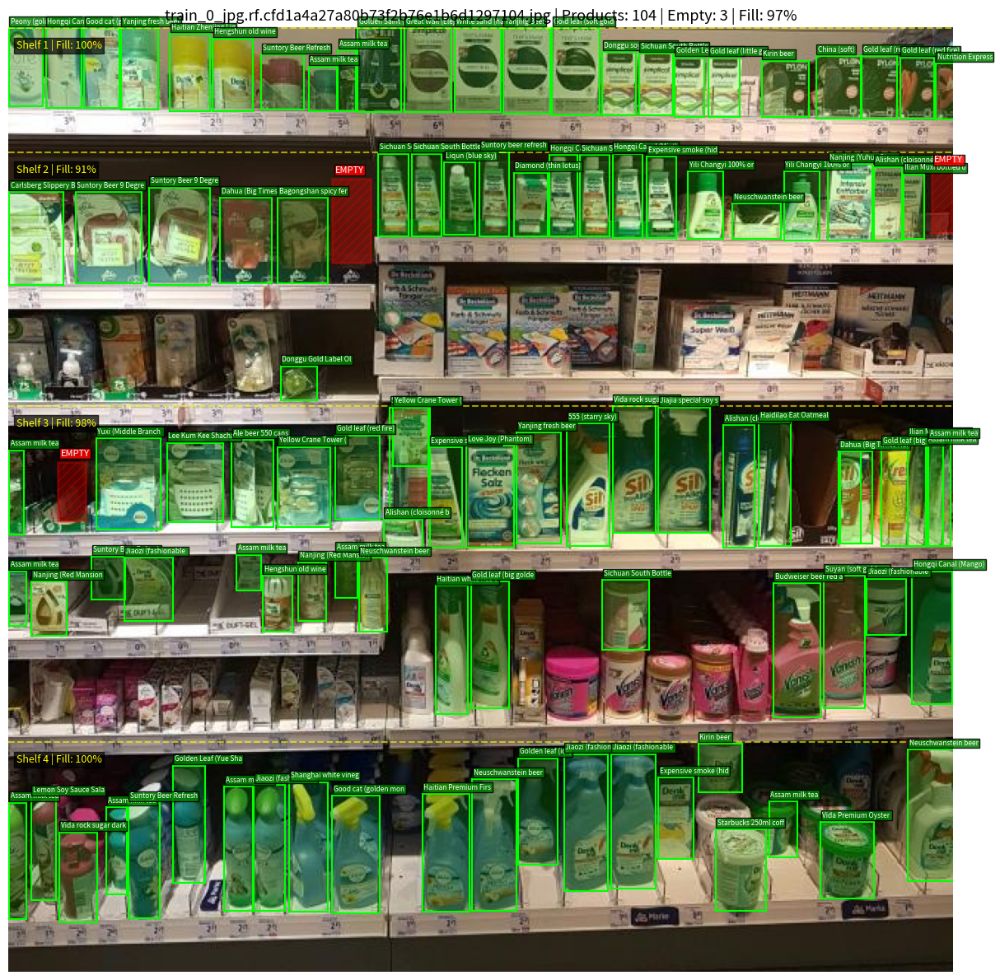

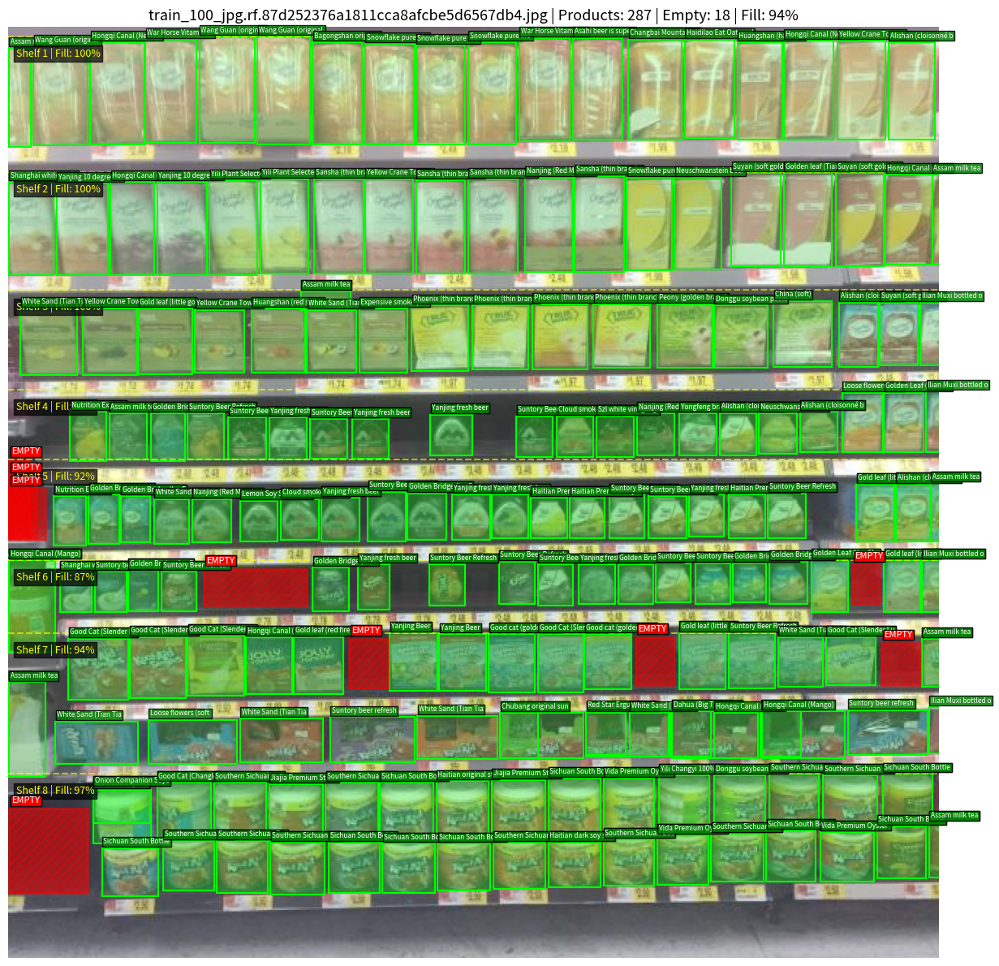

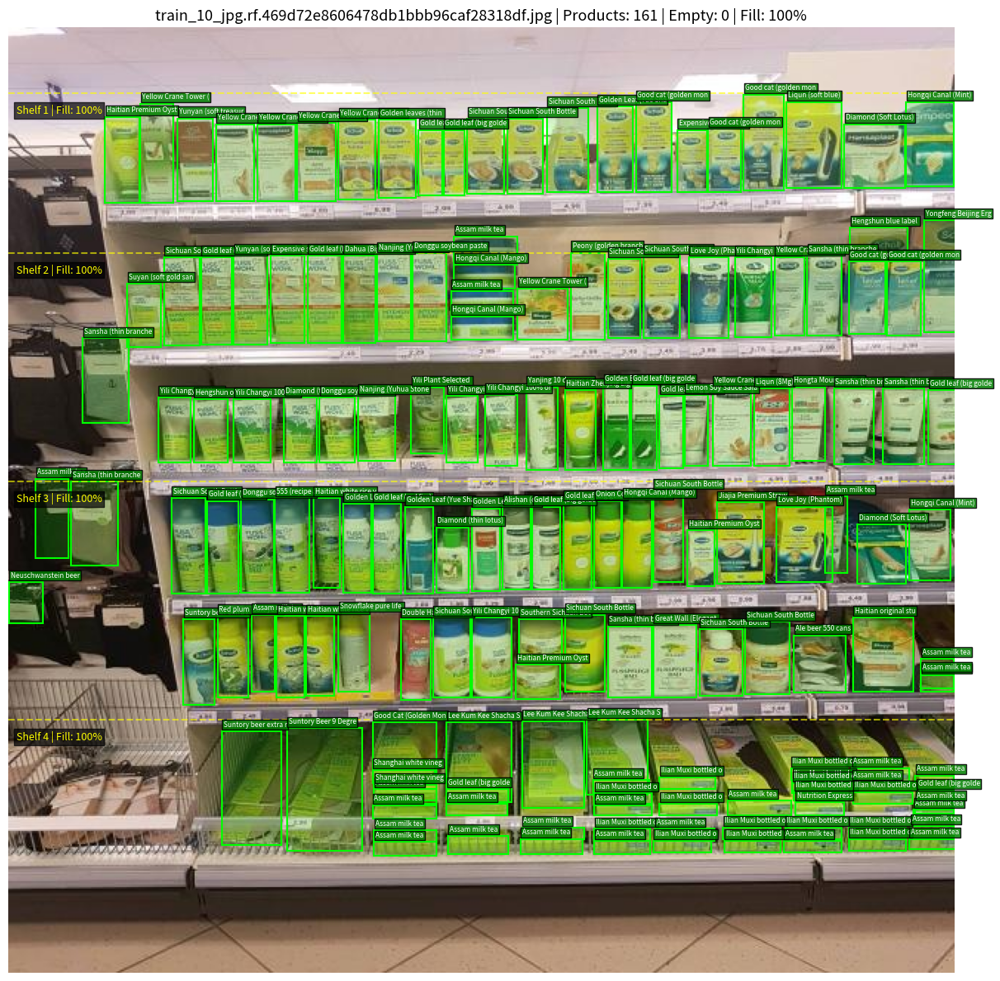

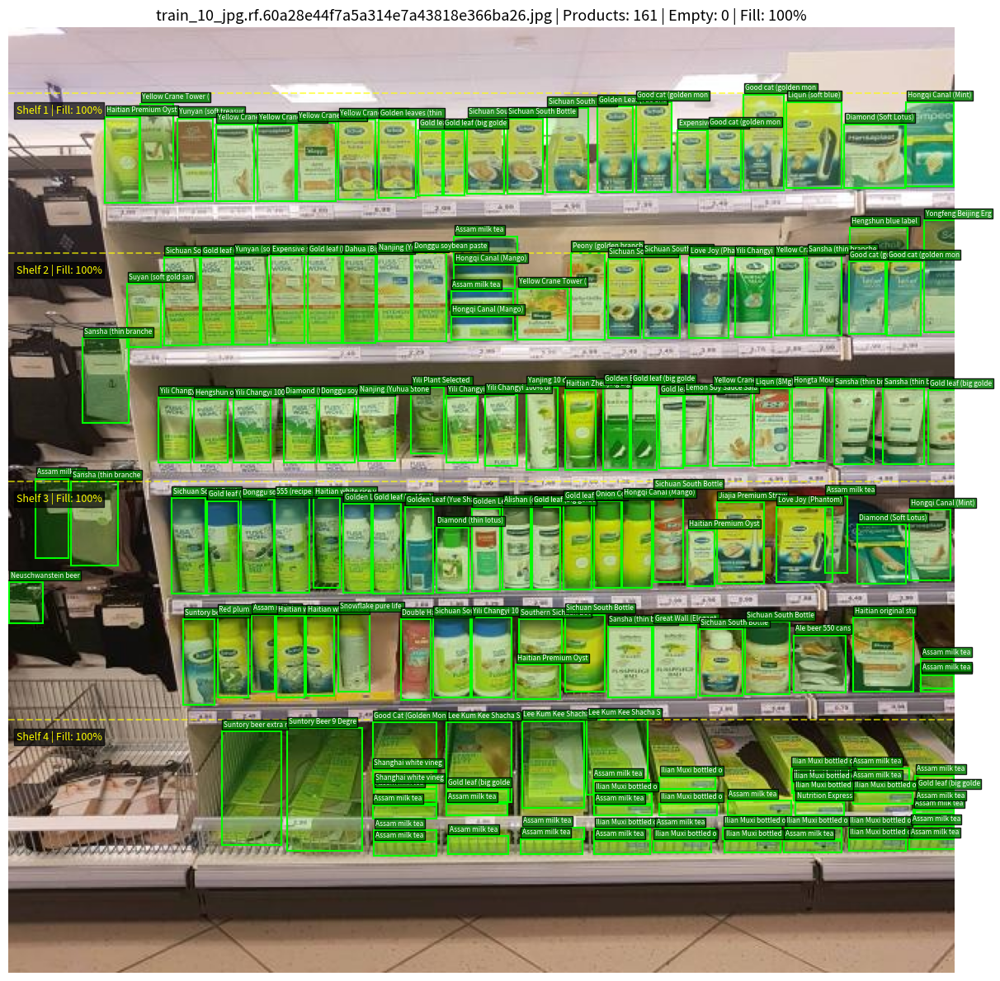

In [55]:
# ============================================================
# Cell 9: Visualize results — combined annotations
# ============================================================

def visualize_result(image_path, result, save_path=None):
    img = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]
    
    fig, ax = plt.subplots(figsize=(18, 12))
    ax.imshow(img)
    
    for shelf in result["shelves"]:
        yt = int(shelf["y_top"] * h)
        ax.axhline(y=yt, color="yellow", linewidth=1.5, linestyle="--", alpha=0.6)
        ax.text(5, yt+14, f"Shelf {shelf['shelf_number']} | Fill: {shelf['fill_rate']:.0%}",
                color="yellow", fontsize=9, fontweight="bold",
                bbox=dict(facecolor="black", alpha=0.7, pad=2))
        
        # Products (green + product name)
        for p in shelf["products"]:
            px = p["bbox_px"]
            rect = patches.Rectangle((px["x1"], px["y1"]), px["x2"]-px["x1"], px["y2"]-px["y1"],
                                     linewidth=1.5, edgecolor="lime", facecolor="lime", alpha=0.15)
            ax.add_patch(rect)
            rect2 = patches.Rectangle((px["x1"], px["y1"]), px["x2"]-px["x1"], px["y2"]-px["y1"],
                                      linewidth=1.5, edgecolor="lime", facecolor="none")
            ax.add_patch(rect2)
            
            # Product name
            label = p["name"][:20]
            ax.text(px["x1"]+1, px["y1"]-3, label, color="white", fontsize=6,
                    fontweight="bold", bbox=dict(facecolor="green", alpha=0.85, pad=1))
        
        # Empty spaces (red hatched)
        for e in shelf["empties"]:
            px = e["bbox_px"]
            rect = patches.Rectangle((px["x1"], px["y1"]), px["x2"]-px["x1"], px["y2"]-px["y1"],
                                     linewidth=2, edgecolor="red", facecolor="red", alpha=0.3,
                                     hatch="///")
            ax.add_patch(rect)
            ax.text(px["x1"]+2, px["y1"]-4, "EMPTY", color="white", fontsize=8,
                    fontweight="bold", bbox=dict(facecolor="red", alpha=0.85, pad=1))
    
    ax.set_title(f"{result['image']} | Products: {result['total_products']} | "
                 f"Empty: {result['total_empty']} | Fill: {result['fill_rate']:.0%}", fontsize=13)
    ax.axis("off")
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches="tight")
    plt.show()

# Visualize first 5 results
for i, result in enumerate(all_results[:5]):
    img_path = images_to_process[i]
    save_path = os.path.join(OUTPUT_DIR, f"{Path(img_path).stem}_annotated.png")
    visualize_result(img_path, result, save_path)

In [57]:
# ============================================================
# Cell 10: Export combined CSV + summary
# ============================================================

# Flat CSV
rows = []
for result in all_results:
    for shelf in result["shelves"]:
        for p in shelf["products"]:
            rows.append({
                "image": result["image"],
                "shelf": shelf["shelf_number"],
                "shelf_fill_rate": shelf["fill_rate"],
                "loc_id": p["loc_id"],
                "product_name": p["name"],
                "status": "stocked",
                "detection_conf": p["confidence"],
                "clip_score": p.get("clip_score", ""),
                "facings": p["facings"],
                "cx": p["bbox"]["cx"], "cy": p["bbox"]["cy"],
                "w": p["bbox"]["w"], "h": p["bbox"]["h"],
            })
        for e in shelf["empties"]:
            rows.append({
                "image": result["image"],
                "shelf": shelf["shelf_number"],
                "shelf_fill_rate": shelf["fill_rate"],
                "loc_id": e["loc_id"],
                "product_name": "EMPTY",
                "status": "empty",
                "detection_conf": e["confidence"],
                "clip_score": "",
                "facings": 0,
                "cx": e["bbox"]["cx"], "cy": e["bbox"]["cy"],
                "w": e["bbox"]["w"], "h": e["bbox"]["h"],
            })

if rows:
    csv_path = os.path.join(OUTPUT_DIR, "all_detections.csv")
    with open(csv_path, "w", newline="") as f:
        writer = csv.DictWriter(f, fieldnames=rows[0].keys())
        writer.writeheader()
        writer.writerows(rows)
    print(f"Exported {len(rows)} detections to {csv_path}")

# Summary stats
if all_results:
    print(f"\n{'='*60}")
    print(f"BATCH SUMMARY")
    print(f"{'='*60}")
    print(f"Images processed:     {len(all_results)}")
    print(f"Total products found: {sum(r['total_products'] for r in all_results)}")
    print(f"Total empty spaces:   {sum(r['total_empty'] for r in all_results)}")
    print(f"Average fill rate:    {np.mean([r['fill_rate'] for r in all_results]):.1%}")
    print(f"\nOutputs saved to: {OUTPUT_DIR}")
    print("Download from the Output tab →")

Exported 2567 detections to /kaggle/working/planogram_output/all_detections.csv

BATCH SUMMARY
Images processed:     20
Total products found: 2510
Total empty spaces:   57
Average fill rate:    98.2%

Outputs saved to: /kaggle/working/planogram_output
Download from the Output tab →


---
## Summary of what each model does

| Stage | Model | What it finds | Training |
|-------|-------|--------------|----------|
| 1 | YOLOv8s trained on SKU-110K | Every product on the shelf (dense bboxes) | ~4 hrs on Kaggle T4 |
| 2 | Your `best.pt` | Every empty space / gap | Already trained |
| 3 | CLIP + RP2K | Product name for each detection | No training (inference only) |

**Next steps to improve:**
- Save the SKU-110K trained weights and upload as a Kaggle dataset so you skip training next time
- Try `yolov8m.pt` instead of `yolov8s.pt` for better accuracy (slower training)
- Supplement RP2K with photos of actual MCX products for better name matching
- Lower `product_conf` to 0.15 if products are being missed, raise to 0.35 if too many false positives
